# Coursework 2: Generative Models

## Instructions

### Submission
Please submit one zip file on cate - *CW2.zip* containing the following:
1. A version of this notebook containing your answers. Write your answers in the cells below each question. **Please deliver the notebook including the outputs of the cells**
2. Your trained VAE model as *VAE_model.pth*
3. Your trained Generator and Discriminator: *DCGAN_model_D.pth and DCGAN_model_G.pth*


### Training
Training the GAN will take quite a long time (multiple hours), and so you have four options:
1. Use PaperSpace [as suggested for CW1](https://hackmd.io/@afspies/S1stL8Qnt)
2. Use Lab GPUs via SSH.  The VSCode Remote Develop extension is recommended for this. For general Imperial remote working instructions see [this post](https://www.doc.ic.ac.uk/~nuric/teaching/remote-working-for-imperial-computing-students.html). You'll also want to [setup your environment as outlined here](https://hackmd.io/@afspies/Bkd7Zq60K).
3. Use Colab and add checkpointing to the model training code; this is to handle the case where colab stops a free-GPU kernel after a certain number of hours (~4).
4. Use Colab Pro - If you do not wish to use PaperSpace then you can pay for Colab Pro. We cannot pay for this on your behalf (this is Google's fault).


### Testing
TAs will run a testing cell (at the end of this notebook), so you are required to copy your data ```transform``` and ```denorm``` functions to a cell near the bottom of the document (it is demarkated). You are advised to check that your implementations pass these tests (in particular, the jit saving and loading may not work for certain niche functions)

### General
You can feel free to add architectural alterations / custom functions outside of pre-defined code blocks, but if you manipulate the model's inputs in some way, please include the same code in the TA test cell, so our tests will run easily.

<font color="orange">**The deadline for submission is 19:00, Friday 24th February, 2022** </font>

## Setting up working environment
You will need to install pytorch and import some utilities by running the following cell:

In [1]:
!pip install -q torch torchvision altair seaborn
!git clone -q https://github.com/afspies/icl_dl_cw2_utils
from icl_dl_cw2_utils.utils.plotting import plot_tsne
from pathlib import Path
import tqdm

Here we have some default pathing options which vary depending on the environment you are using. You can of course change these as you please.

In [2]:
WORKING_ENV = 'COLAB' # Can be LABS, COLAB or PAPERSPACE
USERNAME = 'hgc19' # If working on Lab Machines - Your college username
assert WORKING_ENV in ['LABS', 'COLAB', 'PAPERSPACE']

if WORKING_ENV == 'COLAB':
    from google.colab import drive
    %load_ext google.colab.data_table
    content_path = '/content/drive/MyDrive/dl_cw_2'
    data_path = './data/'
    drive.mount('/content/drive/') # Outputs will be saved in your google drive

elif WORKING_ENV == 'LABS':
    content_path = '~/Documents/dl_cw_2' # You may want to change this
    # Your python env and training data should be on bitbucket
    data_path = f'/vol/bitbucket/{USERNAME}/dl_cw_data/'

else: # Using Paperspace
    # Paperspace does not properly render animated progress bars
    # Strongly recommend using the JupyterLab UI instead of theirs
    !pip install ipywidgets 
    content_path = '/notebooks'
    data_path = './data/'

content_path = Path(content_path)

Mounted at /content/drive/


## Introduction

For this coursework, you are asked to implement two commonly used generative models:
1. A **Variational Autoencoder (VAE)**
2. A **Deep Convolutional Generative Adversarial Network (DCGAN)**

For the first part you will the MNIST dataset https://en.wikipedia.org/wiki/MNIST_database and for the second the CIFAR-10 (https://www.cs.toronto.edu/~kriz/cifar.html).

Each part is worth 50 points. 

The emphasis of both parts lies in understanding how the models behave and learn, however, some points will be available for getting good results with your GAN (though you should not spend too long on this).

# Part 1 - Variational Autoencoder

## Part 1.1 (25 points)
**Your Task:**

a. Implement the VAE architecture with accompanying hyperparameters. More marks are awarded for using a Convolutional Encoder and Decoder.

b. Design an appropriate loss function and train the model.


In [42]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'CW_VAE/'):
    os.makedirs(content_path/'CW_VAE/')

if not os.path.exists(data_path):
    os.makedirs(data_path)

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

Using cuda


---
## Part 1.1a: Implement VAE (25 Points)
### Hyper-parameter selection


In [43]:
mean = 0.1307
std = 0.3081

In [44]:
# Necessary Hyperparameters 
num_epochs = 5
learning_rate = 1e-3
batch_size = 128
latent_dim = 16# Choose a value for the size of the latent space

# Additional Hyperparameters 


# (Optionally) Modify transformations on input
transform = transforms.Compose([
    transforms.ToTensor()
    #transforms.Normalize((mean,), (std,))
])

# (Optionally) Modify the network's output for visualizing your images
#unnormalize = transforms.Normalize((-mean/std,), (1/std,))
def denorm(x):
    #x = unnormalize(x)
    #x = x.view(x.size(0), 1, 28, 28)
    return x

### Data loading


In [45]:
train_dat = datasets.MNIST(
    data_path, train=True, download=True, transform=transform
)
test_dat = datasets.MNIST(data_path, train=False, transform=transform)

loader_train = DataLoader(train_dat, batch_size, shuffle=True)
loader_test = DataLoader(test_dat, batch_size, shuffle=False)

# Don't change 
sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[:32, :, :, :]
save_image(fixed_input, content_path/'CW_VAE/image_original.png')

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



### Model Definition

<figure>
  <img src="https://blog.bayeslabs.co/assets/img/vae-gaussian.png" style="width:60%">
  <figcaption>
    Fig.1 - VAE Diagram (with a Guassian prior), taken from <a href="https://blog.bayeslabs.co/2019/06/04/All-you-need-to-know-about-Vae.html">1</a>.
  </figcaption>
</figure>


You will need to define:
* The hyperparameters
* The constructor
* encode
* reparametrize
* decode
* forward



Hints:
- It is common practice to encode the log of the variance, rather than the variance
- You might try using BatchNorm

In [46]:
# *CODE FOR PART 1.1a IN THIS CELL*

class VAE(nn.Module):
    def __init__(self, latent_dim):
        super(VAE, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.latent_dim = latent_dim
        self.dim = 28-16
        self.out_channel = 128
        
        # Dropout layer
        self.encDropout = nn.Dropout(0.2)

        # Four convolutional layers for encoding.
        self.encConv1 = nn.Conv2d(1, 16, 5, stride=1, padding=0)
        self.encConv2 = nn.Conv2d(16, 32, 5, stride=1, padding=0)
        self.encConv3 = nn.Conv2d(32, 64, 5, stride=1, padding=0)
        self.encConv4 = nn.Conv2d(64, 128, 5, stride=1, padding=0)

        # Linear layer for mean.
        self.encLinear1 = nn.Linear(self.out_channel*self.dim*self.dim, latent_dim)
        # Linear layer for encoder.
        self.encLinear2 = nn.Linear(self.out_channel*self.dim*self.dim, latent_dim)

        # Decoder linear layer.
        self.decLinear1 = nn.Linear(latent_dim, self.out_channel*self.dim*self.dim)

        # Dropout layer
        self.decDropout = nn.Dropout(0.2)

        # Four convolutional transpose layers to upsample for decoding.
        self.decConv1 = nn.ConvTranspose2d(128, 64, 5, stride=1, padding=0)
        self.decConv2 = nn.ConvTranspose2d(64, 32, 5, stride=1, padding=0)
        self.decConv3 = nn.ConvTranspose2d(32, 16, 5, stride=1, padding=0)
        self.decConv4 = nn.ConvTranspose2d(16, 1, 5, stride=1, padding=0)
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    def encode(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        # Apply four convolutional layers.
        x = F.relu(self.encConv1(x))
        x = F.relu(self.encConv2(x))
        x = self.encDropout(x)
        x = F.relu(self.encConv3(x))
        x = F.relu(self.encConv4(x))
        x = x.view(-1, self.out_channel*self.dim*self.dim)
        # Pass through linear layers corresponding to mean and logvar.
        mu = self.encLinear1(x)
        logvar = self.encLinear2(x)
        return mu, logvar
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def reparametrize(self, mu, logvar):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        # Perform reparameterisation.
        std = torch.exp(0.5*logvar)
        eps = torch.randn_like(std)
        return mu + eps*std
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

    def decode(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        # Pass through decoder convolutional transpose layers.
        z = F.relu(self.decLinear1(z))
        z = z.view(-1, self.out_channel, self.dim, self.dim)
        z = F.relu(self.decConv1(z))
        z = F.relu(self.decConv2(z))
        z = self.decDropout(z)
        z = F.relu(self.decConv3(z))
        # Sigmoid activation for value between 0 and 1.
        z = torch.sigmoid(self.decConv4(z))
        return z
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        # Forward pass of VAE model.
        mu, logvar = self.encode(x)
        z = self.reparametrize(mu, logvar)
        return self.decode(z), mu, logvar
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

model = VAE(latent_dim).to(device)
params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))
print(model)
# optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

Total number of parameters is: 1441953
VAE(
  (encDropout): Dropout(p=0.2, inplace=False)
  (encConv1): Conv2d(1, 16, kernel_size=(5, 5), stride=(1, 1))
  (encConv2): Conv2d(16, 32, kernel_size=(5, 5), stride=(1, 1))
  (encConv3): Conv2d(32, 64, kernel_size=(5, 5), stride=(1, 1))
  (encConv4): Conv2d(64, 128, kernel_size=(5, 5), stride=(1, 1))
  (encLinear1): Linear(in_features=18432, out_features=16, bias=True)
  (encLinear2): Linear(in_features=18432, out_features=16, bias=True)
  (decLinear1): Linear(in_features=16, out_features=18432, bias=True)
  (decDropout): Dropout(p=0.2, inplace=False)
  (decConv1): ConvTranspose2d(128, 64, kernel_size=(5, 5), stride=(1, 1))
  (decConv2): ConvTranspose2d(64, 32, kernel_size=(5, 5), stride=(1, 1))
  (decConv3): ConvTranspose2d(32, 16, kernel_size=(5, 5), stride=(1, 1))
  (decConv4): ConvTranspose2d(16, 1, kernel_size=(5, 5), stride=(1, 1))
)


--- 

## Part 1.1b: Training the Model (5 Points)

### Defining a Loss
Recall the Beta VAE loss, with an encoder $q$ and decoder $p$:
$$ \mathcal{L}=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$

In order to implement this loss you will need to think carefully about your model's outputs and the choice of prior.

There are multiple accepted solutions. Explain your design choices based on the assumptions you make regarding the distribution of your data.

* Hint: this refers to the log likelihood as mentioned in the tutorial. Make sure these assumptions reflect on the values of your input data, i.e. depending on your choice you might need to do a simple preprocessing step.

* You are encouraged to experiment with the weighting coefficient $\beta$ and observe how it affects your training

In [47]:
# Function which calculates test loss for a given model.
def test_loss(model, loader_test, beta):
    # Log testing loss.
    model.eval()
    running_test_loss = 0
    running_test_log_likelihood_loss = 0
    running_test_kl_divergence_loss = 0
    batch_num = 0
    with torch.no_grad():
        for i, (data, _) in enumerate(loader_test):
            data = data.to(device)
            # Forward pass of batch.
            recon_batch, mu, logvar = model(data)
            # Get losses
            loss, log_likelihood_loss, kl_divergence_loss = loss_function_VAE(recon_batch, data, mu, logvar, beta)
            running_test_loss += (loss.item()/len(data))
            running_test_log_likelihood_loss += (log_likelihood_loss.item()/len(data))
            running_test_kl_divergence_loss += (kl_divergence_loss.item()/len(data))
            batch_num += 1
    # Average the losses across the number of batches.
    average_test_loss = running_test_loss/batch_num
    average_test_log_likelihood_loss = running_test_log_likelihood_loss/batch_num
    average_test_kl_divergence_loss = running_test_kl_divergence_loss/batch_num
    return average_test_loss, average_test_log_likelihood_loss, average_test_kl_divergence_loss
    

### Code for main training of the model, beta = 4.

---



In [48]:
# *CODE FOR PART 1.1b IN THIS CELL*

def loss_function_VAE(recon_x, x, mu, logvar, beta):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        # Binary cross entropy fo rreconstruction loss.
        BCE = F.binary_cross_entropy(recon_x, x, reduction='sum')
        # KL divergence.
        KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
        return BCE + beta*KLD, BCE, KLD
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

# info increment
inf_inc = 100

# Log testing loss across epochs
test_losses = []
test_log_likelihood_losses = []
test_kl_divergence_losses = []

model.train()
# <- You may wish to add logging info here
losses = []
log_likelihood_losses = []
kl_divergence_losses = []

for epoch in range(num_epochs):  
    # <- You may wish to add logging info here
    running_loss = 0.0
    running_log_likelihood_loss = 0.0
    running_kl_divergence_loss = 0.0
    with tqdm.tqdm(loader_train, unit="batch") as tepoch: 
        for batch_idx, (data, _) in enumerate(tepoch):   
            #######################################################################
            #                       ** START OF YOUR CODE **
            #######################################################################
            model.train()
            # Need at least one batch/random data with right shape -
                        # This is required to initialize to model properly below
                        # when we save the computational graph for testing (jit.save)
            data = data.to(device)
            optimizer.zero_grad()
            # Forward pass.
            recon_batch, mu, logvar = model(data)
            # Get losses.
            loss, log_likelihood_loss, kl_divergence_loss = loss_function_VAE(recon_batch, data, mu, logvar, beta=2.5)
            loss.backward()
            optimizer.step()

            #######################################################################
            #                       ** END OF YOUR CODE **
            ####################################################################### 
            if batch_idx % 20 == 0:
                tepoch.set_description(f"Epoch {epoch}")
                tepoch.set_postfix(loss=loss.item()/len(data))
            
            if batch_idx % inf_inc == 0:
                # Track training and test losses at current increment.
                losses.append(loss.item()/len(data))
                log_likelihood_losses.append(log_likelihood_loss.item()/len(data))
                kl_divergence_losses.append(kl_divergence_loss.item()/len(data))

                av_test_loss, av_test_log_likelihood_loss, av_test_kl_divergence = test_loss(model, loader_test, beta=2.5)
                test_losses.append(av_test_loss)
                test_log_likelihood_losses.append(av_test_log_likelihood_loss)
                test_kl_divergence_losses.append(av_test_kl_divergence)

    # save the model
    if epoch == num_epochs - 1:
        with torch.no_grad():
            torch.jit.save(torch.jit.trace(model, (data), check_trace=False),
                content_path/'CW_VAE/VAE_model.pth')


Epoch 4: 100%|██████████| 469/469 [00:25<00:00, 18.60batch/s, loss=131]


In [49]:
# Function to train a VAE model with easy changing of beta.
def train_model(model, num_epochs, inf_inc, beta):

    # Log testing loss across epochs
    test_losses = []
    test_log_likelihood_losses = []
    test_kl_divergence_losses = []

    model.train()
    # <- You may wish to add logging info here
    losses = []
    log_likelihood_losses = []
    kl_divergence_losses = []

    for epoch in range(num_epochs):  
        # <- You may wish to add logging info here
        running_loss = 0.0
        running_log_likelihood_loss = 0.0
        running_kl_divergence_loss = 0.0
        with tqdm.tqdm(loader_train, unit="batch") as tepoch: 
            for batch_idx, (data, _) in enumerate(tepoch):   
                #######################################################################
                #                       ** START OF YOUR CODE **
                #######################################################################
                model.train()
                # Need at least one batch/random data with right shape -
                            # This is required to initialize to model properly below
                            # when we save the computational graph for testing (jit.save)
                data = data.to(device)
                optimizer.zero_grad()
                # Forward pass.
                recon_batch, mu, logvar = model(data)
                # Get losses.
                loss, log_likelihood_loss, kl_divergence_loss = loss_function_VAE(recon_batch, data, mu, logvar, beta)
                loss.backward()
                optimizer.step()

                #######################################################################
                #                       ** END OF YOUR CODE **
                ####################################################################### 
                if batch_idx % 20 == 0:
                    tepoch.set_description(f"Epoch {epoch}")
                    tepoch.set_postfix(loss=loss.item()/len(data))
                
                if batch_idx % inf_inc == 0:
                    # Track training and testing losses for increment.
                    losses.append(loss.item()/len(data))
                    log_likelihood_losses.append(log_likelihood_loss.item()/len(data))
                    kl_divergence_losses.append(kl_divergence_loss.item()/len(data))

                    av_test_loss, av_test_log_likelihood_loss, av_test_kl_divergence = test_loss(model, loader_test, beta)
                    test_losses.append(av_test_loss)
                    test_log_likelihood_losses.append(av_test_log_likelihood_loss)
                    test_kl_divergence_losses.append(av_test_kl_divergence)

        # save the model
        if epoch == num_epochs - 1:
            with torch.no_grad():
                torch.jit.save(torch.jit.trace(model, (data), check_trace=False),
                    content_path/'CW_VAE/VAE_model.pth')
    
    return test_losses, test_log_likelihood_losses, test_kl_divergence_losses, losses, log_likelihood_losses, kl_divergence_losses

### Loss Explanation
Explain your choice of loss and how this relates to:

* The VAE Prior
* The output data domain
* Disentanglement in the latent space


**YOUR ANSWER**

The loss function is comprised of the log likelihood (reconstruction) loss summed with the KL divergence between the latent distribution and the prior distribution.
$$ \mathcal{L}=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$
Within the above loss function, the log likelihood loss is implemented using binary cross entropy. This is because the distribution of pixel values within the MNIST training dataset are close to either 0 or 1 and so we can approximate the pixel value distribution as Bernoulli. Whereas, if we model the image pixel values in a range of 0 to 1 as a Gaussian distribution this would add a lot more variability in the possible values and make optimisation much harder, this would be implemented using mean squared error for example. Therefore, when modelling using binary cross entropy we are able to optimise more closely to the output domain allowing us to achieve better results.

For the prior distribution we assume a standard normal distribution $p(\mathbf{z}) = N(\mathbf{z} | \mathbf{0},\mathbf{I})$, meanwhile given an input $\mathbf{x}$ we model the latent distribution as $q_\phi(\mathbf{z} | \mathbf{x}) = N(\mathbf{z} | \mu_\phi(\mathbf{x}),\sigma_\phi(\mathbf{x}))$ where $\mu_\phi(\mathbf{x})$ is the mean outputted from the encoder layer and $\sigma_\phi(\mathbf{x})$ corresponds to the square root of the exponent of the log variance outputted by the encoder layer. The KL divergence between the two distributions is then calculated as: $D_{KL}(q_\phi(\mathbf{z} | \mathbf{x}) || p_\theta(\mathbf{z})) = -\frac{1}{2} ∑^K_{i=1}(1 + \log(\sigma_{\phi,i}^2) - \mu_{\phi,i}^2 - \sigma_{\phi,i}^2)$, as seen in tutorial 6. This means that we can sum the mean and log variance vectors after performing the appropriate elementwise calculation to compute the KL divergence.

The $\beta$ coefficient in the loss function scales the amount of effect the KL divergence between the latent distribution and the prior distribution has on the loss function. 

The prior distribution forces the latent distribution to be around the zero point of the feature space and therefore for image generation the model will have learned similar points in a dense region.

The reason the prior distribution is assumed to be a standard normal distribution is because the covariance matrix is isotropic which means that there is no covariance between different features of the data. This encourages the features of the latent space to be independent from each other and learn disentangled representations of the data. Therefore, by increasing the value of beta we increase the constraint on the loss function such that the latent space distribution has to match the standard normal distribution and thus impose stronger disentanglement constraints on the model. However, if the value of beta is too high then the model will not be able to learn a good representation of the data and will not be able to reconstruct the input data well.


<h2>Part 1.2 (9 points)</h2>

a. Plot your loss curves

b. Show reconstructions and samples

c. Discuss your results from parts (a) and (b)

## Part 1.2a: Loss Curves (3 Points)
Plot your loss curves (6 in total, 3 for the training set and 3 for the test set): total loss, reconstruction log likelihood loss, KL loss (x-axis: epochs, y-axis: loss). If you experimented with different values of $\beta$, you may wish to display multiple plots (worth 1 point).

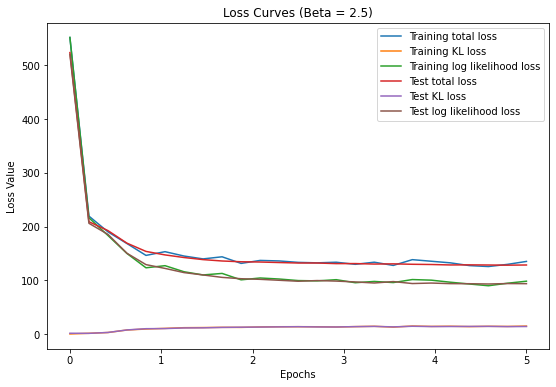

In [50]:
# *CODE FOR PART 1.2a IN THIS CELL*
epoch_axis = np.linspace(0,num_epochs,len(losses))
plt.figure(figsize=(9,6))
plt.plot(epoch_axis, losses, label="Training total loss")
plt.plot(epoch_axis, kl_divergence_losses, label="Training KL loss")
plt.plot(epoch_axis, log_likelihood_losses, label="Training log likelihood loss")
plt.plot(epoch_axis, test_losses, label="Test total loss")
plt.plot(epoch_axis, test_kl_divergence_losses, label="Test KL loss")
plt.plot(epoch_axis, test_log_likelihood_losses, label="Test log likelihood loss")
plt.xlabel("Epochs")
plt.ylabel("Loss Value")
plt.title("Loss Curves (Beta = 2.5)")

plt.legend()
plt.show()

Loss Curves for beta = 0, 1, 20

<table><tr>
<td> 
  <p align="center" style="padding: 10px">
    <img alt="Forwarding" src="https://drive.google.com/uc?id=1rcdBLhO1VXxkq7PVUqC6O028JgZQU0ON" width="%30">
    <br>
    <em style="color: grey"></em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1HopPYd1VpPPoRHMc6LwuUZhYIPs5wKzx" width="%30">
    <br>
    <em style="color: grey"></em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1eJ250VHriUtR0cDoasQ8CuTbJpq4X18s" width="%30">
    <br>
    <em style="color: grey"></em>
  </p> 
</td>
</tr></table

## Part 1.2b: Samples and Reconstructions (6 Points)
Visualize a subset of the images of the test set and their reconstructions **as well as** a few generated samples. Most of the code for this part is provided. You only need to call the forward pass of the model for the given inputs (might vary depending on your implementation).

For reference, here's [some samples from our VAE](https://imgur.com/NwNMuG3).


Input images
--------------------------------------------------
Reconstructed images
--------------------------------------------------
Generated Images
--------------------------------------------------


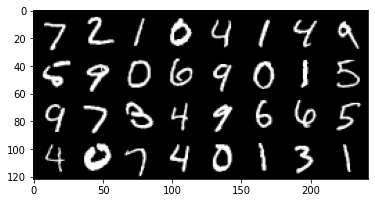

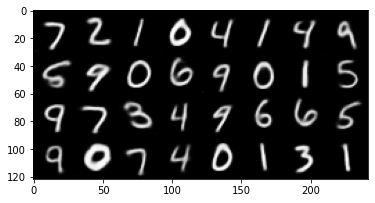

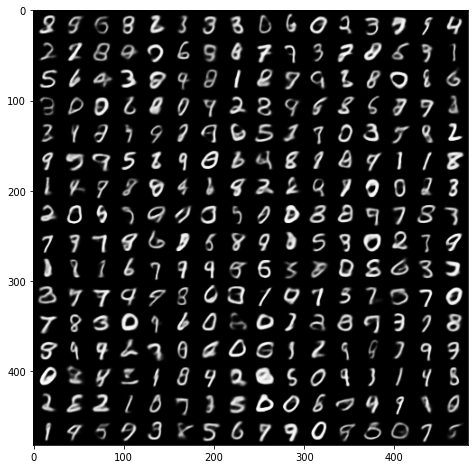

In [51]:
# *CODE FOR PART 1.2b IN THIS CELL*

# load the model
print('Input images')
print('-'*50)

sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[0:32, :, :, :]
# visualize the original images of the last batch of the test set
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
show(img)

print('Reconstructed images')
print('-'*50)
with torch.no_grad():
    # visualize the reconstructed images of the last batch of test set
    
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    recon_batch, _, _ = model(fixed_input.to(device))
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    recon_batch = recon_batch.cpu()
    recon_batch = make_grid(denorm(recon_batch), nrow=8, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure()
    show(recon_batch)

print('Generated Images')  
print('-'*50)
model.eval()
n_samples = 256
z = torch.randn(n_samples,latent_dim).to(device)
with torch.no_grad():
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    samples = model.decode(z)
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    samples = samples.cpu()
    samples = make_grid(denorm(samples), nrow=16, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (8,8))
    show(samples)



Reconstructions and generations for beta = 0, 20.

<table><tr>
<td>
  <p align="center" style="padding: 10px">
    <img alt="Forwarding" src="https://drive.google.com/uc?id=11NPGQraod_xQY4S8rwY9CI4yqU8qjZgE" width="%30">
    <br>
    <em style="color: grey">Beta = 0</em>
  </p> 
</td>
<td>
  <p align="center" style="padding: 10px">
    <img alt="Forwarding" src="https://drive.google.com/uc?id=1uaTBR4-4XpPl1k5_dPa47kCDs39HWwQ9" width="%30">
    <br>
    <em style="color: grey">Beta = 20</em>
  </p> 
</td>
</tr></table

### Discussion
Provide a brief analysis of your loss curves and reconstructions: 
* What do you observe in the behaviour of the log-likelihood loss and the KL loss (increasing/decreasing)?
* Can you intuitively explain if this behaviour is desirable? 
* What is posterior collapse and did you observe it during training (i.e. when the KL is too small during the early stages of training)? 
    * If yes, how did you mitigate it? How did this phenomenon reflect on your output samples?
    * If no, why do you think that is?

**YOUR ANSWER**

### Loss Curves

For $\beta = 20$ we notice that almost immediately the log likelihood loss is unable to decrease further because of how heavily the KL loss is affecting learning. When the $\beta$ value is high this means that the $q$ distribution will match the prior as much as possible but as a consequence is unable to learn a good latent space encoding because the prior will not depend on $\mathbf{x}$. Therefore, the log likelihood (reconstruction) loss remains high because the output images don't depend on $\mathbf{x}$ and therefore the model produces poor reconstructions. The KL loss in the case where $\beta = 20$ remains 0 meaning the two distributions always match. This causes both the reconstructed images and generated images to be bad as the model fails to learn good encodings of the $\mathbf{x}$ inputs.

Conversely, for lower values of $\beta$ such as 0 and 1 we notice that the KL loss is able to increase to high values. This means that that the $q$ distribution doesn't really match the prior and in the case where $\beta = 0$ the distribution is spread as much as needed in order to form the most accurate reconstruction possible. This means that the log likelihood (reconstruction) loss decreases to much lower values. When this is the case, it means that the quality of reconstructed images is very good because the model has purely been trained to minimise reconstruction loss. However, it means that generated images from samples of the prior distribution are poor. This is because the resulting encoded image in the latent space is not forced to lie in the dense space of the prior distribution. Therefore, when generating images, the samples taken from the prior distribution are not often seen during model training. Thus, the reconstructed images are dissimilar to true images in the dataset.

Overall, choosing a value of $\beta = 2.5$ finds a good point where the reconstruction loss is able to converge to a low value, while the $q$ distribution is also able to remain fairly similar to the standard normal distribution meaning the KL divergence term doesn't get too high.

In all the plots, excluding for $\beta = 20$, we see the KL divergence increasing, starting at a value of 0. This is due to the initialisation of the model, initially the $q$ distribution is close to the $p$ distribution. However, as the model learns to encode the input data the $q$ distribution starts to diverge from the prior distribution in order to form a good encoding of the data in the latent space. This increase then plateaus once the two distributions get too dissimilar and the KL divergence term of the loss penalises the model.

Note that a decrease in log likelihood loss is desirable as this means that the reconstructed images are close to the true images. However, a low log likelihood loss value often comes with a trade-off of higher KL divergence as discussed.

### Reconstructed and Generated Images

The reconstructions were more accurate for $\beta=0$ because the model learns purely to reconstruct the images as best as possible. However, this means that the latent space is sparse within the prior distribution and thus the images generated from samples of the latent space were much worse, compared to higher $\beta$ values, and do not replicate true images that can be found in the dataset.

Conversely, for a larger values of $\beta$, such as seen for $\beta=2.5$, the quality of the reconstructions become slightly less defined however the generated images were much more similar to images found in the dataset. The reconstructions are worse because the model is now penalised when the learned $q$ distribution is too dissimilar to the prior distribution and thus causes the reconstructed images to be less accurate. The images generated by the model are improved because learned encodings now appear in the area of high probability of the prior distribution in the latent space, meaning the decoder learns well in this area.

If the beta value is increased too much, as seen for $\beta=20$, this doesn't allow the model to learn anything with regards to the input $\mathbf{x}$ meaning that both the reconstructions and generated images were not close to anything within the dataset.

Overall, a value of $\beta = 2.5$ finds a balance where the reconstructed images are close to the original images because the model is able to effectively encode information from the provided input. While the model also learns to decode a high number of distinct latent vector samples from the dense area of $p$ distribution, therefore it is good at generating images which are similar to those in the input dataset

### Posterior Collapse

Posterior collapse occurs when the posterior distribution collapses to the prior such that $q(\mathbf{z} | \mathbf{x}) = q(\mathbf{z}) = p(\mathbf{z})$ giving a KL divergence term of 0. This means that the learned posterior distribution does not depend on input data $\mathbf{x}$ and thus the model fails to learn how to represent the input data within the latent space. This causes the behaviour described above and can be seen in the reconstructions when $\beta = 20$. To mitigate this, we can use a lower value of $\beta$ to lower the influence the KL divergence term has on the loss. It is likely that posterior collapse wasn't a major problem when training VAE models on the MNIST dataset due to the low number of features that the model needs to learn. This means that the model can learn a good representation of the data whilst still being able to match the prior distribution.


---
<h2> Part 1.3 (11 points) <h2/>

Qualitative analysis of the learned representations

In this question you are asked to qualitatively assess the representations that your model has learned. In particular:

a. Dimensionality Reduction of learned embeddings

b. Interpolating in the latent space

## Part 1.3a: T-SNE on Embeddings (7 Points)
Extract the latent representations of the test set and visualize them using [T-SNE](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding)  [(see implementation)](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html). You can use a T-SNE implementation from a library such as scikit-learn. 

We've provided a function to visualize a subset of the data, but you are encouraged to also produce a matplotlib plot (please use different colours for each digit class).

In [52]:
# *CODE FOR PART 1.3a IN THIS CELL
from sklearn.manifold import TSNE

test_dataloader = DataLoader(test_dat, 10000, shuffle=False)

sample_inputs, labels = next(iter(test_dataloader))
print(sample_inputs.shape)

torch.Size([10000, 1, 28, 28])


In [53]:
# Interactive Visualization - Code Provided

fixed_input = sample_inputs[0:10000, :, :, :]
# visualize the original images of the last batch of the test set
with torch.no_grad():
    # visualize the reconstructed images of the last batch of test set
    
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    recon_batch, mu, log_var = model(fixed_input.to(device))
    z = model.reparametrize(mu, log_var)
    z_embedded = TSNE(n_components=2,perplexity=20.0).fit_transform(z.cpu().numpy())

""" Inputs to the function are
        z_embedded - Embedded X, Y positions for every point in test_dataloader
        test_dataloader - dataloader with batchsize set to 10000
        num_points - number of points plotted (will slow down with >1k)
"""



/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


'\xa0Inputs to the function are\n        z_embedded - Embedded X, Y positions for every point in test_dataloader\n        test_dataloader - dataloader with batchsize set to 10000\n        num_points - number of points plotted (will slow down with >1k)\n'

In [54]:
plot_tsne(z_embedded, test_dataloader, num_points=1000, darkmode=False)

alt.HConcatChart(...)

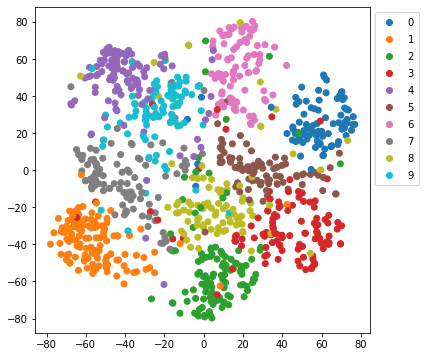

In [55]:
# Custom Visualizations
plt.figure(figsize=(6,6))
scatter = plt.scatter(z_embedded[:1000,0], z_embedded[:1000,1], c=labels[:1000], cmap='tab10')
handles, labels1 = scatter.legend_elements()
plt.legend(handles, labels1, bbox_to_anchor=(1,1))
plt.show()

### Other TSNE Plots

<table><tr>
<td>
  <p align="center" style="padding: 10px">
    <img alt="Forwarding" src="https://drive.google.com/uc?id=11t-03KtF0hsB6sjSh4EgdIUrRmBJx19V" width="%30">
    <br>
    <em style="color: grey">TSNE Plot, Beta = 0</em>
  </p> 
</td>
<td>
  <p align="center" style="padding: 10px">
    <img alt="Forwarding" src="https://drive.google.com/uc?id=1axHLXLg8W3XaOZuIVHphdYiv_qdyDlAI" width="%30">
    <br>
    <em style="color: grey">TSNE Plot, Beta = 20</em>
  </p> 
</td>
</tr></table

### Discussion
What do you observe? Discuss the structure of the visualized representations. 
* What do you observe? What role do the KL loss term and $\beta$ have, if any, in what you observe (multiple matplotlib plots may be desirable here)?
    * Consider Outliers
    * Counsider Boundaries
    * Consider Clusters
* Is T-SNE reliable? What happens if you change the parameters (don't worry about being particularly thorough). [This link](https://distill.pub/2016/misread-tsne/) may be helpful.

Note - If you created multiple plots and want to include them in your discussion, the best option is to upload them to (e.g.) google drive and then embed them via a **public** share link. If you reference local files, please include these in your submission zip, and use relative pathing if you are embedding them (with the notebook in the base directory)

**YOUR ANSWER**

In the above visualised TSNE representations we have plotted the latent space representations of a subset of the test set. We have plotted the representations for $\beta = 0, 2.5, 20$ to show how the variation of this hyperparameter and thus the KL divergence affects the latent space representations. For $\beta = 0$ this means that there is no penalty when the $q$ distribution diverges from the assumed standard normal $p$ distribution. This means that the model learns the encoding such that the reconstructions are as good as possible, this causes the encoded points in the latent space to be spread out widely in clusters of similar images (which correspond to the same numbers). As the value of $\beta$ increases we notice that the distribution of points starts to become more similar to the shape of a 2-dimensional gaussian distribution. This is because the effect of the KL divergence on the loss function is increased which forces the $q$ distribution to match the $p$ distribution more closely and thus follow a standard normal distribution. In the plot for $\beta = 20$ we notice that the distribution of points is very dense around the area of high density of the standard normal distribution.

However, we also notice that as the $\beta$ value increases the distinction between clusters of images of each number become less distinct. For example, when $\beta = 20$ we notice that there appears to be no distinction in clusters of the different labelled images, this is caused because the KL divergence term overwhelms the loss function and therefore the learned $q$ distribution doesn't depend on the input $\mathbf{x}$ and so no clusters form in the latent space.

Ideally, the tsne distribution is dense and takes the form of the standard normal distribution whilst maintaining clusters in the latent space, this corresponds to a model which is able to accurately reconstruct images and also generates images well when latent space points are sampled from the standard normal distribution. This is closer to what is seen for $\beta = 2.5$ where the distribution is dense around the 0 point of the latent space and any there are no gaps between clusters of digits in the latent space. Additionally the overlap of clusters is minimised.

At the boundaries of clusters in the latent representation we will most likely see images of digits which have a close resemblance but still lie in a different class. For example, there are a large number of 9s which are look similar to 4s within the dataset. Within this representation, the encodings of these particular images will lie close to the same boundary.

We do notice that there are outliers for each digit, these points in the tsne representation lie far away from the main bulk of the cluster corresponding to that digit. It is likely that these particular digits look similar to the other digits in nearby clusters.

TSNE representation is not completely reliable because when the data becomes more complex it is harder to embed as 2 dimensions in a way which effectively represents the data. This is especially true if the perplexity parameter of the TSNE embedding is reduced meaning the embedding might not represent the true distribution of the data. For example, below we show the TSNE representation for $\beta = 0$ but the perplexity argument reduced to 2.0, this shows a more compact distribution than what we know to be true.



#### Reliability of TSNE
<table><tr>
<td>
  <p align="center" style="padding: 10px">
    <img alt="Forwarding" src="https://drive.google.com/uc?id=1O0KveuXEAks9m3Mcvaqw9bF1-Npg0lPO" width="%30">
    <br>
    <em style="color: grey">TSNE Plot with Perplexity 2.0, Beta = 0</em>
  </p> 
</td>
</tr></table

## Part 1.3b: Interpolating in $z$ (4 Points)
Perform a linear interpolation in the latent space of the autoencoder by choosing any two digits from the test set. What do you observe regarding the transition from on digit to the other?

_hint: Locate the positions in latent space of 2 data points (maybe a one and an eight). Then sample multiple latent space vectors along the line which joins the 2 points and pass them through the decoder._


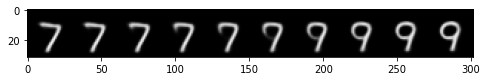

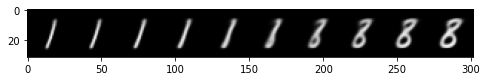

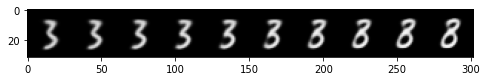

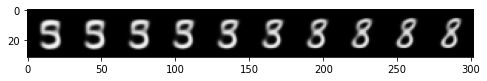

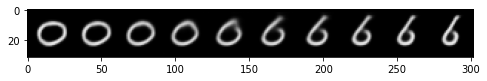

In [56]:
# CODE FOR PART 1.3b IN THIS CELL

sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[50:70, :, :, :]

### 7 to 2 ###
img_7 = sample_inputs[0,:,:,:]
img_2 = sample_inputs[16,:,:,:]
img_7 = img_7.to(device)
img_2 = img_2.to(device)
enc_7_mu, enc_7_logvar = model.encode(img_7)
latent_7 = model.reparametrize(enc_7_mu, enc_7_logvar)
enc_2_mu, enc_2_logvar = model.encode(img_2)
latent_2 = model.reparametrize(enc_2_mu, enc_2_logvar)

weights = np.linspace(0, 1, 10)
interpolated = []
for w in weights:
    interpolated.append(torch.lerp(latent_7, latent_2, w))
interpolated = torch.stack(interpolated)
interpolated = interpolated.view(-1, latent_dim)
interpolated = interpolated.to(device)
with torch.no_grad():
    recon_batch = model.decode(interpolated)
    recon_batch = recon_batch.cpu()
    recon_batch = make_grid(denorm(recon_batch), nrow=10, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (8,8))
    show(recon_batch)

### 1 to 9 ###
img_1 = sample_inputs[2,:,:,:]
img_9 = sample_inputs[110,:,:,:]
img_1 = img_1.to(device)
img_9 = img_9.to(device)
enc_1_mu, enc_1_logvar = model.encode(img_1)
latent_1 = model.reparametrize(enc_1_mu, enc_1_logvar)
enc_9_mu, enc_9_logvar = model.encode(img_9)
latent_9 = model.reparametrize(enc_9_mu, enc_9_logvar)

weights = np.linspace(0, 1, 10)
interpolated = []
for w in weights:
    interpolated.append(torch.lerp(latent_1, latent_9, w))
interpolated = torch.stack(interpolated)
interpolated = interpolated.view(-1, latent_dim)
interpolated = interpolated.to(device)
with torch.no_grad():
    recon_batch = model.decode(interpolated)
    recon_batch = recon_batch.cpu()
    recon_batch = make_grid(denorm(recon_batch), nrow=10, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (8,8))
    show(recon_batch)


### 3 to 8 ###
img_1 = sample_inputs[112,:,:,:]
img_9 = sample_inputs[110,:,:,:]
img_1 = img_1.to(device)
img_9 = img_9.to(device)
enc_1_mu, enc_1_logvar = model.encode(img_1)
latent_1 = model.reparametrize(enc_1_mu, enc_1_logvar)
enc_9_mu, enc_9_logvar = model.encode(img_9)
latent_9 = model.reparametrize(enc_9_mu, enc_9_logvar)

weights = np.linspace(0, 1, 10)
interpolated = []
for w in weights:
    interpolated.append(torch.lerp(latent_1, latent_9, w))
interpolated = torch.stack(interpolated)
interpolated = interpolated.view(-1, latent_dim)
interpolated = interpolated.to(device)
with torch.no_grad():
    recon_batch = model.decode(interpolated)
    recon_batch = recon_batch.cpu()
    recon_batch = make_grid(denorm(recon_batch), nrow=10, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (8,8))
    show(recon_batch)


### 5 to 8 ###
img_1 = sample_inputs[120,:,:,:]
img_9 = sample_inputs[110,:,:,:]
img_1 = img_1.to(device)
img_9 = img_9.to(device)
enc_1_mu, enc_1_logvar = model.encode(img_1)
latent_1 = model.reparametrize(enc_1_mu, enc_1_logvar)
enc_9_mu, enc_9_logvar = model.encode(img_9)
latent_9 = model.reparametrize(enc_9_mu, enc_9_logvar)

weights = np.linspace(0, 1, 10)
interpolated = []
for w in weights:
    interpolated.append(torch.lerp(latent_1, latent_9, w))
interpolated = torch.stack(interpolated)
interpolated = interpolated.view(-1, latent_dim)
interpolated = interpolated.to(device)
with torch.no_grad():
    recon_batch = model.decode(interpolated)
    recon_batch = recon_batch.cpu()
    recon_batch = make_grid(denorm(recon_batch), nrow=10, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (8,8))
    show(recon_batch)


### 0 to 1 ###
img_1 = sample_inputs[69,:,:,:]
img_9 = sample_inputs[50,:,:,:]
img_1 = img_1.to(device)
img_9 = img_9.to(device)
enc_1_mu, enc_1_logvar = model.encode(img_1)
latent_1 = model.reparametrize(enc_1_mu, enc_1_logvar)
enc_9_mu, enc_9_logvar = model.encode(img_9)
latent_9 = model.reparametrize(enc_9_mu, enc_9_logvar)

weights = np.linspace(0, 1, 10)
interpolated = []
for w in weights:
    interpolated.append(torch.lerp(latent_1, latent_9, w))
interpolated = torch.stack(interpolated)
interpolated = interpolated.view(-1, latent_dim)
interpolated = interpolated.to(device)
with torch.no_grad():
    recon_batch = model.decode(interpolated)
    recon_batch = recon_batch.cpu()
    recon_batch = make_grid(denorm(recon_batch), nrow=10, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (8,8))
    show(recon_batch)


# visualize the original images of the last batch of the test set
# img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
#                 range=None, scale_each=False, pad_value=0)
# plt.figure()
# show(img)


### Discussion
What did you observe in the interpolation? Is this what you expected?
* Can you relate the interpolation to your T-SNE visualization

**YOUR ANSWER**

From the interpolation we observe the continuity of the latent space and how well the model can generate images of digits when we move through it. In particular, notice that when interpolating from a 7 to a 9 the top left tip of the 7 starts to curl and form a 9, this shows that the model has learned this feature difference between a 7 and 9 and moving from the area of the 7 to the 9 in the latent space causes this feature to change to form the corresponding digit. This is expected, the aim of applying the KL divergence term in the loss function when training the model is to force the encoded representations of the images into a particular region of the latent space. This means that sampling points within this region will allow for good generation of new images.

Relating this to the TSNE representations, the interpolation from one digit to another in the latent space visualises crossing over the boundary of two clusters of digit image encodings to see the change of features in the generated images. In the case of the interpolation from 1 to 8 we notice that in between the digit somewhat resembles a 5. This is because at this point in the latent space we pass close to the region where the model encodes digits of 5s and thus when generating this image, it shows similar features to that of a 5.

# Part 2 - Deep Convolutional GAN

In this task, your main objective is to train a DCGAN (https://arxiv.org/abs/1511.06434) on the CIFAR-10 dataset. You should experiment with different architectures and tricks for stability in training (such as using different activation functions, batch normalization, different values for the hyper-parameters, etc.). In the end, you should provide us with: 

- your best trained model (which we will be able to load and run), 
- some generations for the fixed latent vectors $\mathbf{z}\sim \mathcal{N}\left(\mathbf{0}, \mathbf{I}\right)$ we have provided you with (train for a number of epochs and make sure there is no mode collapse), 
- plots with the losses for the discriminator $D$ and the generator $G$ as the training progresses and explain whether your produced plots are theoretically sensible and why this is (or not) the case. 
- a discussion on whether you noticed any mode collapse, where this behaviour may be attributed to, and explanations of what you did in order to cope with mode collapse. 

## Part 2.1 (30 points)
**Your Task**: 

a. Implement the DCGAN architecture. 

b. Define a loss and implement the Training Loop

c. Visualize images sampled from your best model's generator ("Extension" Assessed on quality)

d. Discuss the experimentations which led to your final architecture. You can plot losses or generated results by other architectures that you tested to back your arguments (but this is not necessary to get full marks).


_Clarification: You should not be worrying too much about getting an "optimal" performance on your trained GAN. We want you to demonstrate to us that you experimented with different types of DCGAN variations, report what difficulties transpired throughout the training process, etc. In other words, if we see that you provided us with a running implementation, that you detail different experimentations that you did before providing us with your best one, and that you have grapsed the concepts, you can still get good marks. The attached model does not have to be perfect, and the extension marks for performance are only worth 10 points._

In [3]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torch.optim.lr_scheduler import StepLR, MultiStepLR
import torch.nn.functional as F
import matplotlib.pyplot as plt

mean = torch.Tensor([0.4914, 0.4822, 0.4465])
std = torch.Tensor([0.247, 0.243, 0.261])
unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())

def denorm(x, channels=None, w=None ,h=None, resize = False):
    
    x = unnormalize(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'CW_GAN'):
    os.makedirs(content_path/'CW_GAN')

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

Using cuda


### Part 2.1a: Implement DCGAN (8 Points)
Fill in the missing parts in the cells below in order to complete the Generator and Discriminator classes. You will need to define:

- The hyperparameters
- The constructors
- `decode`
- `discriminator`

Recomendations for experimentation:
- use the architecture that you implemented for the Autoencoder of Part 1 (encoder as discriminator, decoder as generator).
- use the architecture desribed in the DCGAN paper (https://arxiv.org/abs/1511.06434).

Some general reccomendations:
- add several convolutional layers (3-4).
- accelerate training with batch normalization after every convolutional layer.
- use the appropriate activation functions. 
- Generator module: the upsampling can be done with various methods, such as nearest neighbor upsampling (`torch.nn.Upsample`) or transposed convolutions(`torch.nn.ConvTranspose2d`). 
- Discriminator module: Experiment with batch normalization (`torch.nn.BatchNorm2d`) and leaky relu (`torch.nn.LeakyReLu`) units after each convolutional layer.

Try to follow the common practices for CNNs (e.g small kernels, max pooling, RELU activations), in order to narrow down your possible choices.

<font color="red">**Your model should not have more than 25 Million Parameters**</font>

The number of epochs that will be needed in order to train the network will vary depending on your choices. As an advice, we recommend that while experimenting you should allow around 20 epochs and if the loss doesn't sufficiently drop, restart the training with a more powerful architecture. You don't need to train the network to an extreme if you don't have the time.

#### Data loading

In [4]:
batch_size = 64  # change that

transform = transforms.Compose([
     transforms.ToTensor(),
     transforms.Normalize(mean=mean, std=std),                        
])
# note - data_path was initialized at the top of the notebook
cifar10_train = datasets.CIFAR10(data_path, train=True, download=True, transform=transform)
cifar10_test = datasets.CIFAR10(data_path, train=False, download=True, transform=transform)
loader_train = DataLoader(cifar10_train, batch_size=batch_size)
loader_test = DataLoader(cifar10_test, batch_size=batch_size)

  0%|          | 0/170498071 [00:00<?, ?it/s]

Extracting ./data/cifar-10-python.tar.gz to ./data/
Files already downloaded and verified


We'll visualize a subset of the test set: 

torch.Size([64, 3, 32, 32])


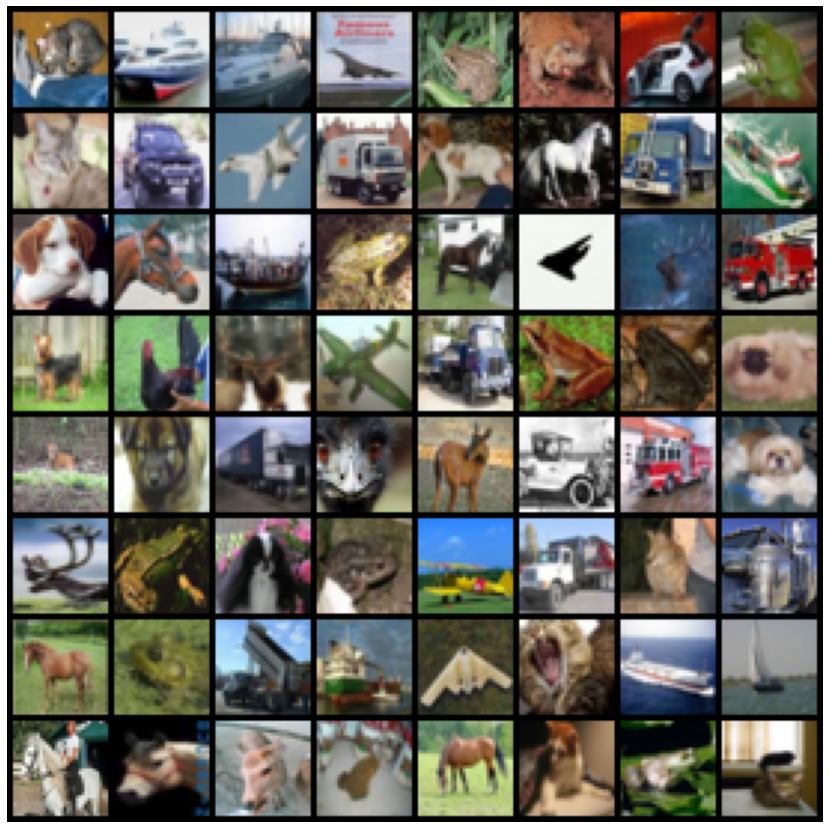

In [5]:
samples, _ = next(iter(loader_test))
print(samples.shape)

samples = samples.cpu()
samples = make_grid(denorm(samples), nrow=8, padding=2, normalize=False,
                        range=None, scale_each=False, pad_value=0)
plt.figure(figsize = (15,15))
plt.axis('off')
show(samples)

#### Model Definition
Define hyperparameters and the model

In [6]:
# *CODE FOR PART 2.1 IN THIS CELL*

# Choose the number of epochs, the learning rate
# and the size of the Generator's input noise vetor.

num_epochs = 100
learning_rate = 0.0002
latent_vector_size = 190

# Other hyperparams

embedding_dim = 100
num_classes = 10

In [7]:
# *CODE FOR PART 2.1 IN THIS CELL*


class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        # Label embedding and convolution.
        self.label_emb = nn.Embedding(num_classes, embedding_dim)
        self.conv_emb = nn.Conv2d(embedding_dim, 16, 1, 1, 0, bias=False)
        self.leaky_relu = nn.LeakyReLU(0.2, inplace=True)

        # Generator layers.
        self.conv1 = nn.ConvTranspose2d(latent_vector_size, 1024, 4, 1, 0, bias=False)
        self.bn1 = nn.BatchNorm2d(1024)
        self.conv2 = nn.ConvTranspose2d(1025, 512, 4, 2, 1, bias=False)
        self.bn2 = nn.BatchNorm2d(512)
        self.conv3 = nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False)
        self.bn3 = nn.BatchNorm2d(256)
        self.conv4 = nn.ConvTranspose2d(256, 3, 4, 2, 1, bias=False)
        self.relu = nn.ReLU(True)
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

    # You can modify the arguments of this function if needed
    def forward(self, z, label):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        # Label embeddinng and forward pass.
        label = self.label_emb(label)
        label = label.view(z.shape[0], 100, 1, 1)
        label = self.leaky_relu(self.conv_emb(label))
        label = label.view(-1, 1, 4, 4)

        # Input forward pass
        out = self.relu(self.bn1(self.conv1(z)))
        # Concatenate label representation.
        out = torch.cat((out, label), 1)
        # Continue forward pass.
        out = self.relu(self.bn2(self.conv2(out)))
        out = self.relu(self.bn3(self.conv3(out)))
        # Tanh scaling for brightness of output images.
        out = 2*nn.Tanh()(self.conv4(out))
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################
        return out


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        # Label embedding and upsampling layers
        self.label_emb = nn.Embedding(num_classes, embedding_dim)
        self.conv_label = nn.ConvTranspose2d(embedding_dim, 3*32*32,1,1,0, bias=False)

        # Main discriminator layers.
        self.conv1 = nn.Conv2d(6, 128, 4, 2, 1, bias=False)
        self.conv2 = nn.Conv2d(128, 256, 4, 2, 1, bias=False)
        self.bn2 = nn.BatchNorm2d(256)
        self.conv3 = nn.Conv2d(256, 512, 4, 2, 1, bias=False)
        self.bn3 = nn.BatchNorm2d(512)
        self.conv4 = nn.Conv2d(512, 1024, 4, 2, 1, bias=False)
        self.bn4 = nn.BatchNorm2d(1024)
        self.conv5 = nn.Conv2d(1024, 1, 2, 1, 0, bias=False)
        self.relu = nn.LeakyReLU(0.2, inplace=True)
        self.sigmoid = nn.Sigmoid()
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    # You can modify the arguments of this function if needed
    def forward(self, x, label):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        # Embed label and upsample
        label = self.label_emb(label)
        label = label.view(x.shape[0], 100, 1, 1)
        label = self.conv_label(label)
        label = label.view(x.shape[0], 3, 32, 32)
        
        # Concatenate label representation to input.
        x = torch.cat((x, label), 1)

        # Forward pass through discriminator network.
        out = self.relu(self.conv1(x))
        out = self.relu(self.bn2(self.conv2(out)))
        out = self.relu(self.bn3(self.conv3(out)))
        out = self.relu(self.bn4(self.conv4(out)))
        out = self.sigmoid(self.conv5(out))
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
        return out


<h2> Initialize Model and print number of parameters </h2>

You can use method `weights_init` to initialize the weights of the Generator and Discriminator networks. Otherwise, implement your own initialization, or do not use at all. You will not be penalized for not using initialization.

In [12]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [13]:
use_weights_init = True

model_G = Generator().to(device)
if use_weights_init:
    model_G.apply(weights_init)
params_G = sum(p.numel() for p in model_G.parameters() if p.requires_grad)
print("Total number of parameters in Generator is: {}".format(params_G))
print(model_G)
print('\n')

model_D = Discriminator().to(device)
if use_weights_init:
    model_D.apply(weights_init)
params_D = sum(p.numel() for p in model_D.parameters() if p.requires_grad)
print("Total number of parameters in Discriminator is: {}".format(params_D))
print(model_D)
print('\n')

print("Total number of parameters is: {}".format(params_G + params_D))

Total number of parameters in Generator is: 13625384
Generator(
  (label_emb): Embedding(10, 100)
  (conv_emb): Conv2d(100, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (leaky_relu): LeakyReLU(negative_slope=0.2, inplace=True)
  (conv1): ConvTranspose2d(190, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (bn1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): ConvTranspose2d(1025, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): ConvTranspose2d(256, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (relu): ReLU(inplace=True)
)


Total number of parameters in Discriminator is: 11338216
Discriminator(
  (la

### Part 2.1b: Training the Model (12 Points)

#### Defining a Loss

In [14]:
# You can modify the arguments of this function if needed
def loss_function(out, labels):
    loss = F.binary_cross_entropy(out, labels)
    return loss

<h3>Choose and initialize optimizers</h3>

In [15]:
# setup optimizer
# You are free to add a scheduler or change the optimizer if you want. We chose one for you for simplicity.
beta1 = 0.5

optimizerD = torch.optim.Adam(model_D.parameters(), lr=learning_rate, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(model_G.parameters(), lr=learning_rate, betas=(beta1, 0.999))


# Schedulers for each network.
gamma_D = 0.9
schedulerD = torch.optim.lr_scheduler.StepLR(optimizerD, step_size=5, gamma=gamma_D)

gamma_G = 0.9
schedulerG = torch.optim.lr_scheduler.StepLR(optimizerG, step_size=5, gamma=gamma_G)

<h3> Define fixed input vectors to monitor training and mode collapse. </h3>

In [16]:
fixed_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
# Additional input variables should be defined here
# Fixed label inputs
fixed_labels = torch.randint(0,9,(batch_size,1),device=device)

#### Training Loop

Complete the training loop below. We've defined some variables to keep track of things during training:
* errD: Loss of Discriminator after being trained on real and fake instances
* errG: Loss of Generator
* D_x: Output of Discriminator for real images
* D_G_z1: Output of Discriminator for fake images (When Generator is not being trained)
* D_G_z2: Output of Discriminator for fake images (When Generator is being trained)

In [17]:
train_losses_G = []
train_losses_D = []

Epoch 4: 100%|██████████| 782/782 [03:05<00:00,  4.22batch/s, D_G_z=0.343/0.007, D_x=0.896, Loss_D=0.802, Loss_G=4.58]


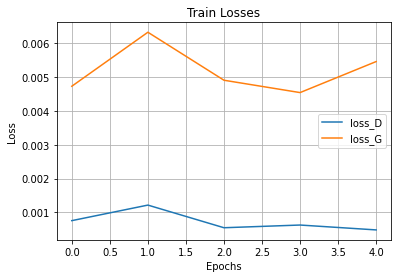

Epoch 9: 100%|██████████| 782/782 [03:05<00:00,  4.22batch/s, D_G_z=0.251/0.003, D_x=0.96, Loss_D=0.7, Loss_G=5.37]


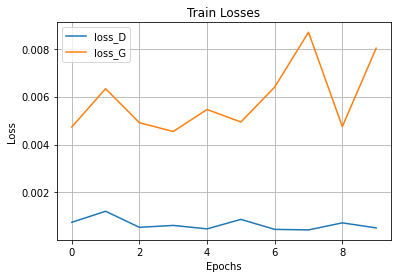

Epoch 14: 100%|██████████| 782/782 [03:05<00:00,  4.23batch/s, D_G_z=0.018/0.019, D_x=0.796, Loss_D=0.404, Loss_G=3.79]


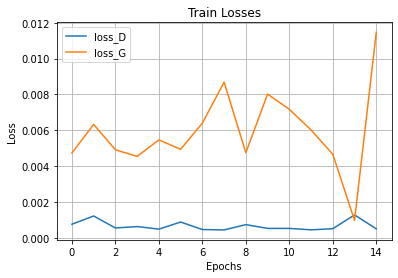

Epoch 19: 100%|██████████| 782/782 [03:05<00:00,  4.22batch/s, D_G_z=0.051/0.018, D_x=0.87, Loss_D=0.397, Loss_G=3.71]


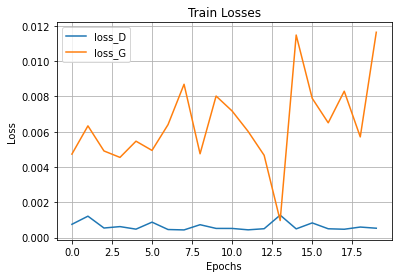

Epoch 24: 100%|██████████| 782/782 [03:05<00:00,  4.22batch/s, D_G_z=0.032/0.049, D_x=0.922, Loss_D=0.386, Loss_G=3.07]


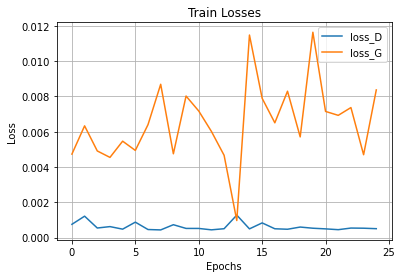

Epoch 29: 100%|██████████| 782/782 [03:04<00:00,  4.23batch/s, D_G_z=0.318/0.002, D_x=0.993, Loss_D=0.938, Loss_G=5.5]


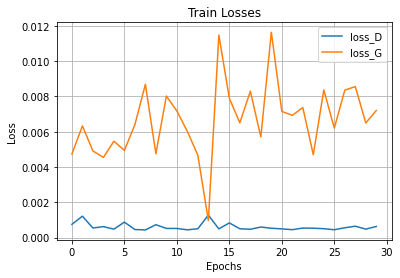

Epoch 34: 100%|██████████| 782/782 [03:05<00:00,  4.22batch/s, D_G_z=0.030/0.016, D_x=0.959, Loss_D=0.401, Loss_G=3.88]


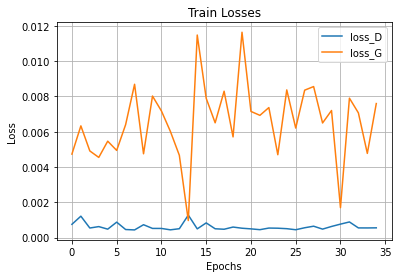

Epoch 39: 100%|██████████| 782/782 [03:05<00:00,  4.22batch/s, D_G_z=0.017/0.138, D_x=0.569, Loss_D=0.635, Loss_G=1.95]


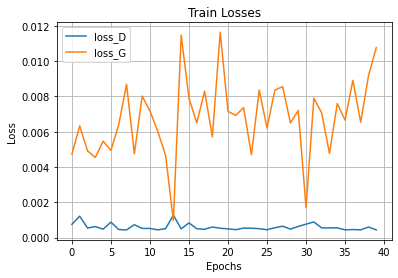

Epoch 44: 100%|██████████| 782/782 [03:05<00:00,  4.22batch/s, D_G_z=0.012/0.009, D_x=0.927, Loss_D=0.352, Loss_G=4.43]


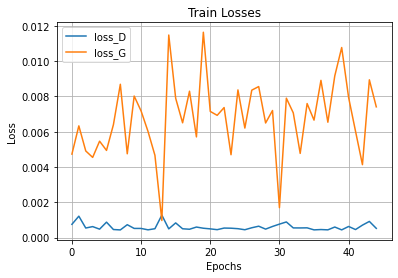

Epoch 49: 100%|██████████| 782/782 [03:05<00:00,  4.21batch/s, D_G_z=0.037/0.012, D_x=0.95, Loss_D=0.395, Loss_G=4.18]


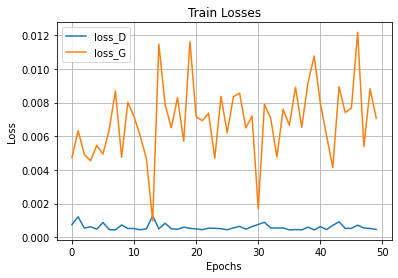

Epoch 54: 100%|██████████| 782/782 [03:05<00:00,  4.21batch/s, D_G_z=0.012/0.027, D_x=0.835, Loss_D=0.367, Loss_G=3.46]


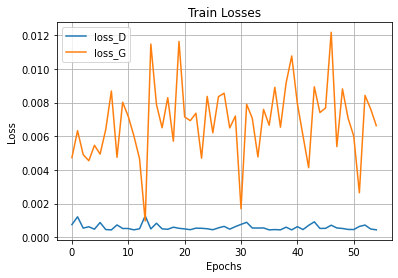

Epoch 59: 100%|██████████| 782/782 [03:05<00:00,  4.22batch/s, D_G_z=0.007/0.011, D_x=0.787, Loss_D=0.392, Loss_G=4.18]


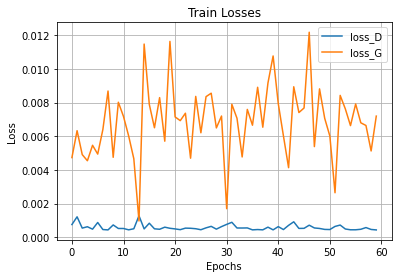

Epoch 64: 100%|██████████| 782/782 [03:05<00:00,  4.22batch/s, D_G_z=0.002/0.002, D_x=0.88, Loss_D=0.336, Loss_G=5.74]


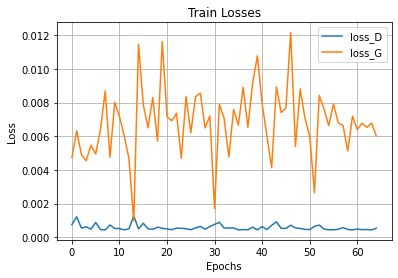

Epoch 69: 100%|██████████| 782/782 [03:05<00:00,  4.22batch/s, D_G_z=0.040/0.020, D_x=0.91, Loss_D=0.372, Loss_G=3.63]


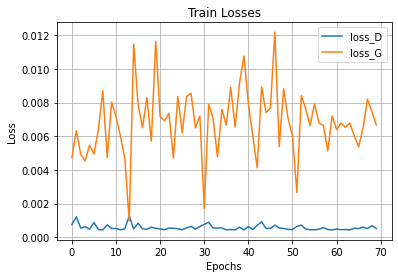

Epoch 74: 100%|██████████| 782/782 [03:05<00:00,  4.21batch/s, D_G_z=0.010/0.005, D_x=0.935, Loss_D=0.351, Loss_G=4.98]


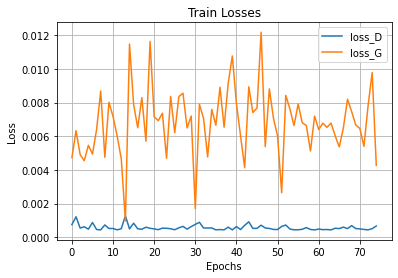

Epoch 79: 100%|██████████| 782/782 [03:05<00:00,  4.22batch/s, D_G_z=0.017/0.021, D_x=0.865, Loss_D=0.354, Loss_G=3.65]


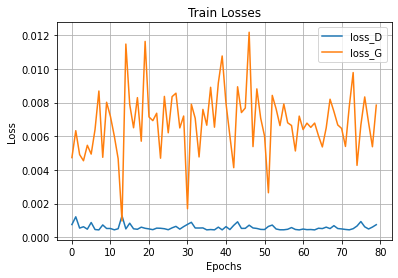

Epoch 84: 100%|██████████| 782/782 [03:05<00:00,  4.21batch/s, D_G_z=0.008/0.006, D_x=0.951, Loss_D=0.359, Loss_G=4.7]


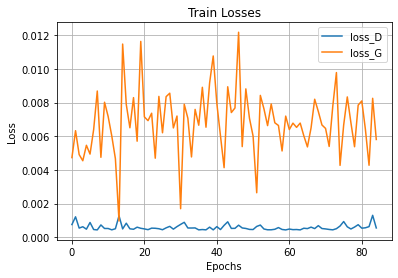

Epoch 89: 100%|██████████| 782/782 [03:06<00:00,  4.20batch/s, D_G_z=0.007/0.004, D_x=0.948, Loss_D=0.355, Loss_G=5.15]


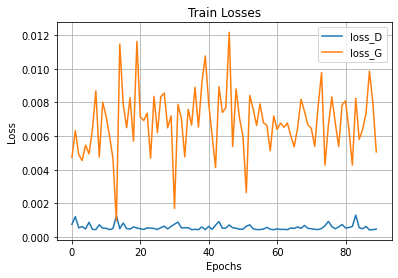

Epoch 94: 100%|██████████| 782/782 [03:05<00:00,  4.21batch/s, D_G_z=0.035/0.017, D_x=0.939, Loss_D=0.376, Loss_G=3.83]


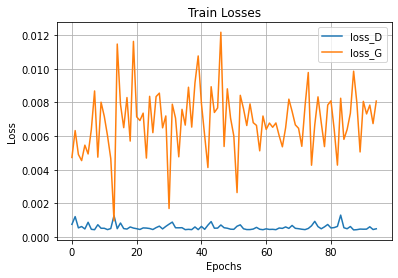

Epoch 99: 100%|██████████| 782/782 [03:05<00:00,  4.22batch/s, D_G_z=0.005/0.003, D_x=0.896, Loss_D=0.333, Loss_G=5.41]


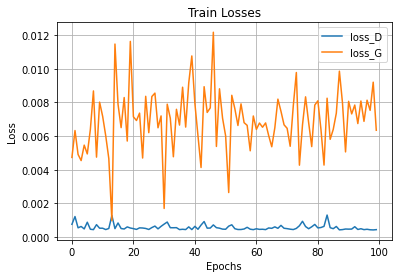

In [18]:
# <- You may wish to add logging info here
for epoch in range(num_epochs):
    # <- You may wish to add logging info here
    with tqdm.tqdm(loader_train, unit="batch") as tepoch: 
        for i, data in enumerate(tepoch):
            train_loss_D = 0
            train_loss_G = 0
            
            #######################################################################
            #                       ** START OF YOUR CODE **
            #######################################################################
            # Real and fake labels, with label smoothing.
            label_real = 0.9*torch.ones(data[0].shape[0], device=device)
            label_fake = torch.zeros(data[0].shape[0], device=device)
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
            model_D.zero_grad()
            # train with real
            real_cpu = data[0].to(device)
            # Get real data output
            real_cpu = real_cpu# + torch.randn(real_cpu.shape, device=device)
            ## Get labels for conditional gan.
            real_labels = data[1].to(device)
            real_labels = real_labels.unsqueeze(1).long()

            # Forward pass of real data.
            output = model_D.forward(real_cpu, real_labels)
            output = output.view(-1)
            # Calculate real data loss
            errD_real = loss_function(output, label_real)
            errD_real.backward()
            D_x = output.mean().item()

            # train with fake
            noise = torch.randn(data[0].shape[0], latent_vector_size, 1, 1, device=device)
            # Generate fake data
            fakes = model_G(noise, real_labels)
            # Get fake data output
            fakes = fakes# + torch.randn(fakes.shape, device=device)
            output = model_D(fakes.detach(), real_labels)
            output = output.view(-1)
            # Calculate fake data loss
            errD_fake = loss_function(output, label_fake)
            errD_fake.backward()
            D_G_z1 = output.mean().item()

            errD = errD_real + errD_fake

            # Step discriminator optimizer
            optimizerD.step()

            # (2) Update G network: maximize log(D(G(z)))
            model_G.zero_grad()

            # Do forward pass of fake data on updated discriminator
            output = model_D(fakes, real_labels)
            output = output.view(-1)
            # Calculate loss
            errG = loss_function(output, label_real)
            errG.backward()
            D_G_z2 = output.mean().item()

            # Step generator optimizer
            optimizerG.step()

            train_loss_G += errG.item()
            train_loss_D += errD.item()
            ####################################################################### 
            #                       ** END OF YOUR CODE **
            ####################################################################### 
            # Logging 
            if i % 50 == 0:
                tepoch.set_description(f"Epoch {epoch}")
                tepoch.set_postfix(D_G_z=f"{D_G_z1:.3f}/{D_G_z2:.3f}", D_x=D_x,
                                  Loss_D=errD.item(), Loss_G=errG.item())

    if epoch == 0:
        save_image(denorm(real_cpu.cpu()).float(), content_path/'CW_GAN/real_samples.png')
    with torch.no_grad():
        fake = model_G(fixed_noise, fixed_labels)
        save_image(denorm(fake.cpu()).float(), content_path/f'CW_GAN/fake_samples_epoch_{epoch}.png')
    train_losses_D.append(train_loss_D / len(loader_train))
    train_losses_G.append(train_loss_G / len(loader_train))

    # Step schedulers.
    schedulerD.step()
    schedulerG.step()

    # Plot losses every 5 epochs.
    if (epoch + 1) % 5 == 0:
        plt.plot(list(range(0, np.array(train_losses_D).shape[0])), np.array(train_losses_D), label='loss_D')
        plt.plot(list(range(0, np.array(train_losses_G).shape[0])), np.array(train_losses_G), label='loss_G')
        plt.legend()
        plt.title('Train Losses')
        plt.ylabel('Loss')
        plt.xlabel('Epochs')
        plt.grid()
        plt.show()
    
# save  models 
# if your discriminator/generator are conditional you'll want to change the inputs here


In [19]:
torch.jit.save(torch.jit.trace(model_G, (fixed_noise, fixed_labels)), content_path/'CW_GAN/GAN_G_model.pth')
torch.jit.save(torch.jit.trace(model_D, (fakes, real_labels)), content_path/'CW_GAN/GAN_D_model.pth')

/usr/local/lib/python3.8/dist-packages/torch/jit/_trace.py:154: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the .grad field to be populated for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations. (Triggered internally at aten/src/ATen/core/TensorBody.h:480.)
  if a.grad is not None:


In [10]:
model_G = torch.jit.load(content_path/'CW_GAN/GAN_G_model.pth')
model_D = torch.jit.load(content_path/'CW_GAN/GAN_D_model.pth')

## Part 2.1c: Results (10 Points)
This part is fairly open-ended, but not worth too much so do not go crazy. The table below shows examples of what are considered good samples. Level 3 and above will get you 10/10 points, level 2 will roughly get you 5/10 points and level 1 and below will get you 0/10 points.

<table><tr>
<td> 
  <p align="center" style="padding: 10px">
    <img alt="Forwarding" src="https://drive.google.com/uc?id=1wQ2f10-A1Vs7k0LMfBPPyYTsPlkBF9QE" width="%30">
    <br>
    <em style="color: grey">Level 1</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1wlDhX4hROET4s8Ndxn8nhj_0RLM2rnuG" width="%30">
    <br>
    <em style="color: grey">Level 2</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1w9VrgfJLCRaTPhwoFVYdYhtCeaQmFHGb" width="%30">
    <br>
    <em style="color: grey">Level 3</em>
  </p> 
</td>
</tr></table>

### Generator samples

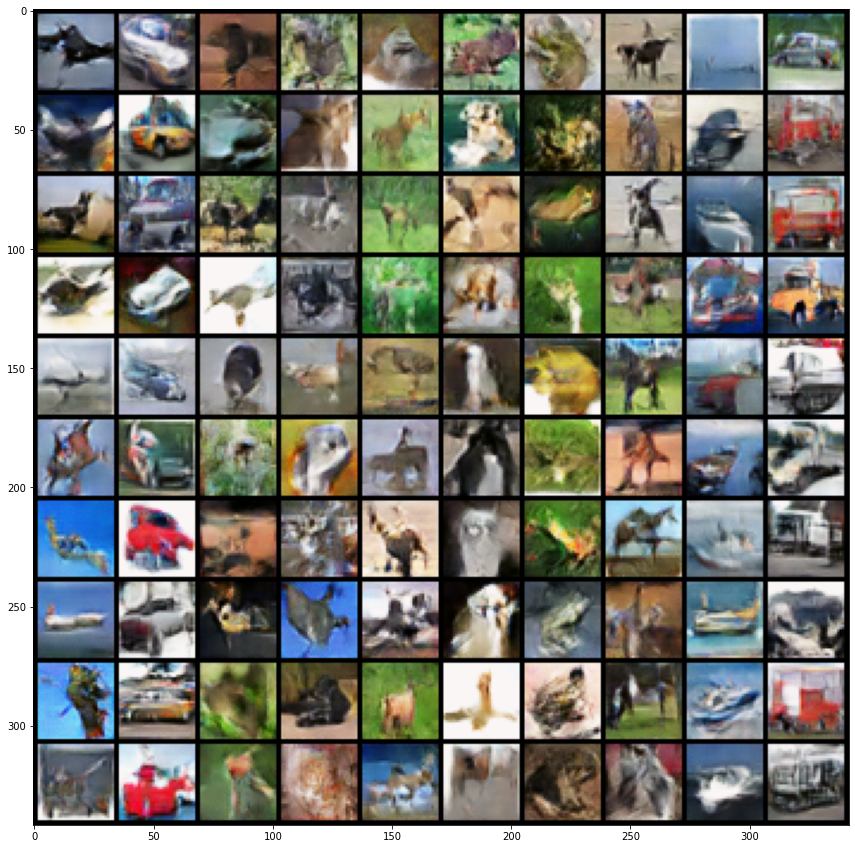

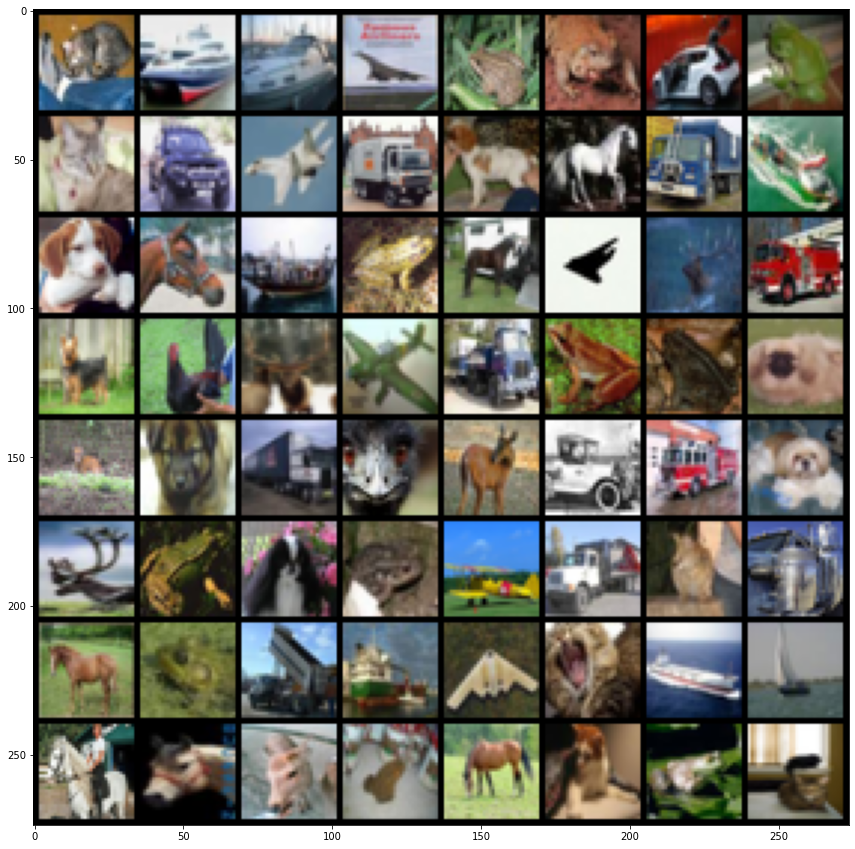

In [20]:
input_noise = torch.randn(100, latent_vector_size, 1, 1, device=device)
# Get input labels in columns of each class.
input_labels = torch.LongTensor(np.array([num for _ in range(10) for num in range(10)])).to(device)
with torch.no_grad():
    # visualize the generated images
    generated = model_G(input_noise, input_labels).cpu()
    generated = make_grid(denorm(generated)[:100], nrow=10, padding=2, normalize=False, 
                        range=None, scale_each=False, pad_value=0)
    plt.figure(figsize=(15,15))
    save_image(generated, content_path/'CW_GAN/Teaching_final.png')
    show(generated) # note these are now class conditional images columns rep classes 1-10

it = iter(loader_test)
sample_inputs, _ = next(it)
fixed_input = sample_inputs[0:64, :, :, :]
# visualize the original images of the last batch of the test set for comparison
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
show(img)

## Part 2.1d: Engineering Choices (10 Points)

Discuss the process you took to arrive at your final architecture. This should include:

* Which empirically useful methods did you utilize
* What didn't work, what worked and what mattered most
* Are there any tricks you came across in the literature etc. which you suspect would be helpful here

**Your Answer**

#### Main GAN Architecture

The architecture includes a generator consisting of 4 strided convolutional transpose layers to up sample the latent dimension each with a ReLU activation function, apart from the output layer which uses a tanh activation to scale the output between -1 and 1.

Similarly, the discriminator includes 5 convolutional layers, the first 4 having a leaky ReLU activation and the last layer has a sigmoid activation function for classification between real and fake images.

After some experimentation with this implementation, as discussed below. The steps were taken to implement a conditional GAN architecture. This allows the discriminator and generator to condition on the input label. The reason the conditional GAN was implemented was to increase the amount of information given to the generator in order to produce images of the given class more accurately. When implementing the conditional GAN, in order to include the label as part of the input, it is embedded to an embedding dimension. In the generator this is passed through a convolutional layer, where the resulting 4x4 tensor is appended as an additional channel to the input of the second convolutional transpose layer of the generator. In the discriminator a convolutional transpose layer with kernel size 1 is used to up sample the embedding dimension to the same dimensions as the input image. This is then appended to the input image.

The reason convolutional layers were used as opposed to fully connected linear layers was to reduce the number of required parameters in the network. The resulting implementation allows us to generate images based on a particular class label.


#### Channels
To arrive at the final architecture a number of engineering choices were made. To start with, the baseline architecture created was made following the PyTorch DCGAN tutorial [1]. Originally this used a generator which up samples the latent dimension to 512x4x4, then continually up samples until reaching the image size of 32x32 and reduces the channels through 4 convolutional transpose layers. Similarly, the discriminator down sampled the image whilst increasing the number of channels to a total of 512 using convolutional layers. Before making any changes, this was tested and it was found that the generated images were of low quality and some issues were seen with the discriminator becoming too good and the generator collapsing all samples to the same noisy output image.

The decision was made to double the number of channels at each convolutional layer in both the generator and discriminator. This causes a large increase in the number of learnable parameters within the network however doing so showed good results. It was found that the generator now had more capacity to learn higher quality features, therefore producing higher quality image samples.

#### Batch Normalisation

Within both the generator and discriminator networks batch norm layers are used between each convolutional layer. Within the literature, this was found to be crucial in enabling stable learning as it means that the inputs into each layer have zero mean and unit variance, therefore allowing for better gradient flow through the network [2].

An experiment was run where the network did not include batch normalisation in between convolutions and we got the results seen below in our sample images and loss plots after 20 epochs. The resulting samples are dull in brightness and thus less similar to the true images compared to when batch norm is included. Similarly, the loss plots show that the discriminator loss is higher than the generator loss which means that the discriminator is struggling to determine between real and fake images which is causing the generated images to be less similar to the images within the dataset. Overall, including batch norm seemed to be one of the more important aspects related to producing satisfactory images.

<table><tr>
<td>
  <p align="center" style="padding: 10px">
    <img alt="Forwarding" src="https://drive.google.com/uc?id=11X6nY5CVJX3K8KfRbv1qV9goiMo9qrwS" width="%30">
    <br>
    <em style="color: grey">Losses with no Batch Normalisation.</em>
  </p> 
</td>
<td>
  <p align="center" style="padding: 10px">
    <img alt="Forwarding" src="https://drive.google.com/uc?id=1pxjR0mBveYUrF4-DGLWl0gSAf-v8ZgFZ" width="%30">
    <br>
    <em style="color: grey">Output sample images with no Batch Normalisation.</em>
  </p> 
</td>
</tr></table


<br />


#### Relu and Leaky Relu Activation

ReLU activation functions are used within the generator and Leaky ReLU activation functions within the discriminator. These activations are used to deal with the vanishing gradient problem often observed with GANs. In particular, the use of Leaky Relu activation functions in the discriminator is recommended in the literature and it is found to improve gradient flow through the model [2]. Whereas Relu activation functions are recommended to be used for the generator as it is found that this enables the generator to produce results from similar inputs which are more distinct.

In practice, when switching between ReLU and Leaky ReLU activation functions in each network and training over 20 epochs, the changes weren't significantly noticeable. Using Leaky ReLU in the generator showed signs of divergence of the generator loss, as the loss had an increasing trend towards the end of training. The decision was made to maintain the original architecture which uses ReLU activations in the generator and Leaky ReLU activations in the discriminator.

<table><tr>
<td>
  <p align="center" style="padding: 10px">
    <img alt="Forwarding" src="https://drive.google.com/uc?id=130rAPsYuSo7w1-0MYT8S-GSW03BnVNLT" width="%30">
    <br>
    <em style="color: grey">Losses when Leaky ReLU activation functions used in Generator.</em>
  </p> 
</td>
</tr></table

<br />


#### Learning Rate and Scheduler

The learning rate used for each network was as suggested in [2]. It was found that the stability of the network was very sensitive when adjusting the learning rate of either network. It was mainly seen that the discriminator would quickly become very good at classifying images and therefore its loss converge to zero and the generator loss diverge quickly producing poor quality sample images.

To try and improve the quality of the images produced by the model, learning rate schedulers were used for both models which stepped the learning rate every 5 epochs. This made a small difference to image quality.

#### Batch Size, Latent Vector Size, Label Smoothing and Embedding Dimension

Adjusting batch size seemed to have little effect on the resulting quality of the images generated by the generator network of the GAN. The latent vector size was set to 190, a large latent vector size can cause the network to overfit and increases the number of parameters in the network leading to slower training times. The size of the embedding dimension also seemed to have little effect on the resulting performance of the model. The purpose of this dimension is to capture the 10 classes and so it is unlikely that increasing this has any effect on the resulting performance of the conditional GAN. In an attempt to increase confusion of the discriminator to allow better training of the GAN, label smoothing was introduced where real labels are assigned a value of 0.9 rather than 1. This change showed little effect on the resulting performance of the model.

#### Conditional GAN

As mentioned, the conditional GAN was implemented in order to provide the network with more information about the image being generated in order to produce more accurate image targeted to each class within the dataset. The increased quality benefits of the cGAN were somewhat minimal however the conditioning on the class label adds more functionality to the image generation capabilities of the network.

Below the losses for the original GAN architecture are plotted, we notice that the generator loss is much more unstable and increases to much higher extreme values. This suggests that the change of architecture to a conditional GAN allows for more stable training. This could be because the model is being provided extra information about the class label and doesn’t have to learn this information itself. This would mean that the produced images replicate the given classes more quickly during training and thus stabilising the losses. Additionally, the discriminator losses for the non-conditional GAN appear to stabilise more quickly at a low value, this suggests that the discriminator converges more quickly to a state where it can differentiate between real and fake images.

Overall, the decision was made to keep the cGAN architecture in the final implementation.



<table><tr>
<td>
  <p align="center" style="padding: 10px">
    <img alt="Forwarding" src="https://drive.google.com/uc?id=1HiFxWnT8gX769sDCMWBzKk8uuX8VRwZL" width="%30">
    <br>
    <em style="color: grey">Losses for normal GAN architecture over 50 epochs.</em>
  </p> 
</td>
</tr></table>

<br />


##### References

[1] - PyTorch DCGAN Tutorial : https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

[2] - Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks. Alec Radford, Luke Metz, Soumith Chintala. 2016. https://arxiv.org/abs/1511.06434

## Part 2.2: Understanding GAN Training (5 points)


### Loss Curves
**Your task:**


Plot the losses curves for the discriminator $D$ and the generator $G$ as the training progresses and explain whether the produced curves are theoretically sensible and why this is (or not) the case (x-axis: epochs, y-axis: loss).

Make sure that the version of the notebook you deliver includes these results.

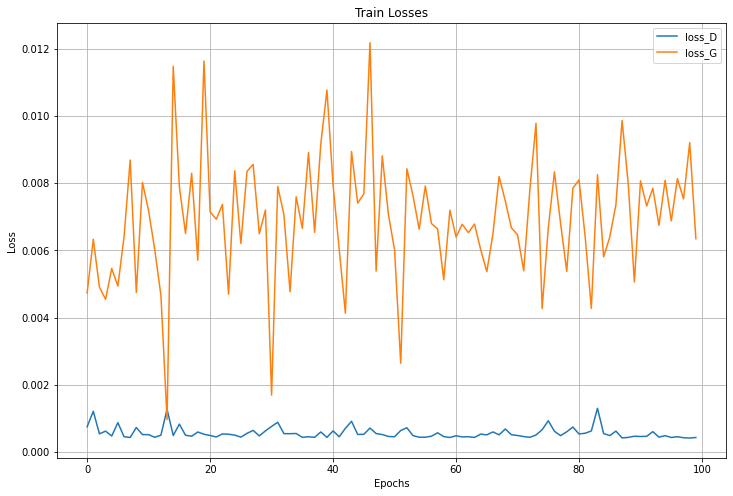

In [21]:
plt.figure(figsize=(12,8))
plt.plot(list(range(0, np.array(train_losses_D).shape[0])), np.array(train_losses_D), label='loss_D')
plt.plot(list(range(0, np.array(train_losses_G).shape[0])), np.array(train_losses_G), label='loss_G')
plt.legend()
plt.title('Train Losses')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.grid()
plt.show()

### Discussion

Do your loss curves look sensible? What would you expect to see and why?

The loss curves are somewhat sensible, ideally we would observe the loss values of both networks decreasing to zero. This is because the loss of the generator is the binary cross entropy of the discriminator's classification of the sample against the real label. Therefore, when the loss is at a minimum all the generated images are being classified as real by the discriminator. Similarly, the discriminator loss is determined by the binary cross entropy of the discriminator's classifications against the true labels. Therefore, a good discriminator would show a loss which converges to zero.

In practice, during training the generator and discriminator are continually trying to outperform each other in a kind of zero sum game, this makes training unstable if there is an imbalance and one of the networks overpowers the other. In the above loss curve, we see that the generator loss doesn't really converge but is noisily constant throughout training. This is because the discriminator has become very good which makes it hard for the generator to improve the generated images because they are almost always being classified as fake. This leaves the training process in a bit of a dead zone where the discriminator has converged to quite a low local minimum where it consistently classifies the generated images well, this stops the generator from continually reducing its loss. In an attempt to mitigate this training dead zone from occurring, we implemented label smoothing where real images are labelled as 0.9 instead of 1.0 in order to create more confusion for the discriminator and reduce its performance. Additionally, inputting noise into the images during classification was attempted but this seemed to reduce the quality of generated images. The irregularity in the loss curves that we do see for both the generator and discriminator could be due to a bit of the zero sum game behaviour occuring where each model is shifting slightly in comparison to the other in terms of how well they perform. Additionally, the noise in the generator loss being so large could be because the generated images are better for certain random noise vectors or class labels which is varying the loss.

Overall, when training a GAN, the performance of the model can be gauged by a combination of the loss behaviour and the quality of the generated images. Therefore, considering the behaviour of the losses is not completely as desired, we can look at the quality of the images generated and determine if they are satisfactory. With more time the training process and engineering of the GAN could be changed to better improve the convergence of the learning.


## Part 2.3: Understanding Mode Collapse (5 points) 
**Your task:**
 
Describe the what causes the phenomenon of Mode Collapse and how it may manifest in the samples from a GAN. 

Based on the images created by your generator using the `fixed_noise` vector during training, did you notice any mode collapse? what this behaviour may be attributed to, and what did you try to eliminate / reduce it?

### Discussion


Mode collapse is a phenomenon which occurs in GANs where the generator network learns to output a limited set of possible samples. This happens during training where the generator converges towards a subset of outputs which can fool the discriminator. The discriminator is likely to be stuck in a local minimum and is therefore unable to correctly label this small subset of generated images as fake. Therefore, no matter where data is sampled from the latent vector space the generator will produce a similar subset of images rather than learning a diverse range of outputs which represents the entirety of the training set. This manifests itself within the output samples of the generator where we notice that images generated from different latent vectors are the same.

It is difficult to measure mode collapse, however early on in engineering of the GAN it was seen particularly when the model was smaller. By increasing the size of the generator network we are able to produce more complex representations of the training data and reduce the possibility of mode collapse.

Another way to reduce the chance of mode collapse is by the use of Wasserstein loss. This method means that the loss is much more stable thus meaning that during training the network is able to get out of any local minimum found by the discriminator and thus identify that the generator is generating a small set of images. This forces the generator to generate different images in order for to try and outperform the discriminator.



# TA Test Cell
TAs will run this cell to ensure that your results are reproducible, and that your models have been defined suitably. 

<font color="orange"> <b> Please provide the input and output transformations required to make your VAE and GANs work. If your GAN generator requires more than just noise as input, also specify this below (there are two marked cells for you to inspect) </b></font>


In [57]:
# If you want to run these tests yourself, change directory:
# %cd '.../dl_cw2/'
ta_data_path = "../data" # You can change this to = data_path when testing

In [58]:
!pip install -q torch torchvision

In [59]:
# Do not remove anything here
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt 

show = lambda img: plt.imshow(np.transpose(img.cpu().numpy(), (1,2,0)))

device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")

# Do not change this cell!
torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

In [60]:
############# CHANGE THESE (COPY AND PASTE FROM YOUR OWN CODE) #############
vae_transform = transforms.Compose([
    transforms.ToTensor(),
])

def vae_denorm(x):
    return x

mean = torch.Tensor([0.4914, 0.4822, 0.4465])
std = torch.Tensor([0.247, 0.243, 0.261])
unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())

def gan_denorm(x, channels=None, w=None ,h=None, resize = False):
    
    x = unnormalize(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

gan_latent_size = 190

# If your generator requires something other than noise as input, please specify
# two cells down from here

In [61]:
# Load VAE Dataset
test_dat = datasets.MNIST(ta_data_path, train=False, transform=vae_transform, 
                          download=True)
vae_loader_test = DataLoader(test_dat, batch_size=32, shuffle=False)

In [62]:
############# MODIFY IF NEEDED #############
vae_input, _ = next(iter(vae_loader_test))

# If your generator is conditional, then please modify this input suitably
input_noise = torch.randn(100, gan_latent_size, 1, 1, device=device)
input_labels = torch.LongTensor(np.array([num for _ in range(10) for num in range(10)])).to(device)
gan_input = [input_noise, input_labels] # In case you want to provide a tuple, we wrap ours

Used CNN


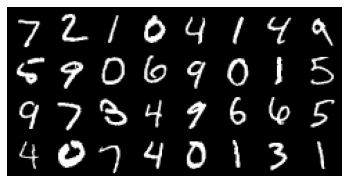

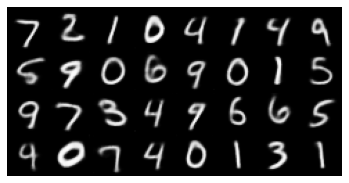

In [63]:
# VAE Tests
# TAs will change these paths as you will have provided the model files manually
"""To TAs, you should have been creating a folder with the student uid
   And the .ipynb + models in the root. Then that path is './VAE_model.pth' etc.
"""
# vae = torch.jit.load(content_path/'CW_VAE/VAE_model.pth')

vae = torch.jit.load('./CW_VAE/VAE_model.pth')
vae.eval()

# Check if VAE is convolutional
def recurse_cnn_check(parent, flag):
    if flag:
        return flag
    children = list(parent.children())
    if len(children) > 0:
        for child in children:
            flag = flag or recurse_cnn_check(child, flag)
    else:
        params = parent._parameters
        if 'weight' in params.keys():
            flag = params['weight'].ndim == 4
    return flag

has_cnn = recurse_cnn_check(vae, False)
print("Used CNN" if has_cnn else "Didn't Use CNN")

vae_in = make_grid(vae_denorm(vae_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_in)

vae_test = vae(vae_input.to(device))[0].detach()
vae_reco = make_grid(vae_denorm(vae_test), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_reco)

Number of Parameters is 24963600 which is ok


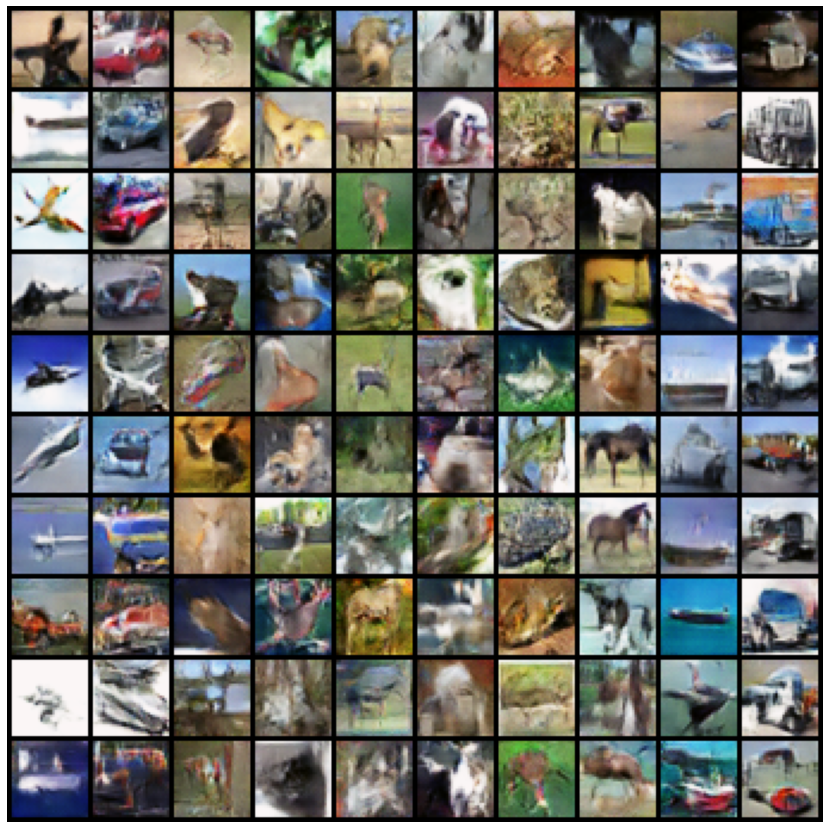

In [64]:
# GAN Tests
# model_G = torch.jit.load(content_path/'CW_GAN/GAN_G_model.pth')
# model_D = torch.jit.load(content_path/'CW_GAN/GAN_D_model.pth')

model_G = torch.jit.load('./CW_GAN/GAN_G_model.pth')
model_D = torch.jit.load('./CW_GAN/GAN_D_model.pth')
[model.eval() for model in (model_G, model_D)]  

# Check that GAN doesn't have too many parameters
num_param = sum(p.numel() for p in [*model_G.parameters(),*model_D.parameters()])

print(f"Number of Parameters is {num_param} which is", "ok" if num_param<25E+6 else "not ok")

# visualize the generated images
generated = model_G(*gan_input).cpu()
generated = make_grid(gan_denorm(generated)[:100].detach(), nrow=10, padding=2, normalize=False, 
                    range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
plt.axis('off')
show(generated)